# Latent space models on networks

In [1]:
import sys
import os
sys.path.append(os.path.abspath(".."))


from LSMN_P import *

## Network

Number of nodes: 34
Number of edges: 78
Connected components: 1


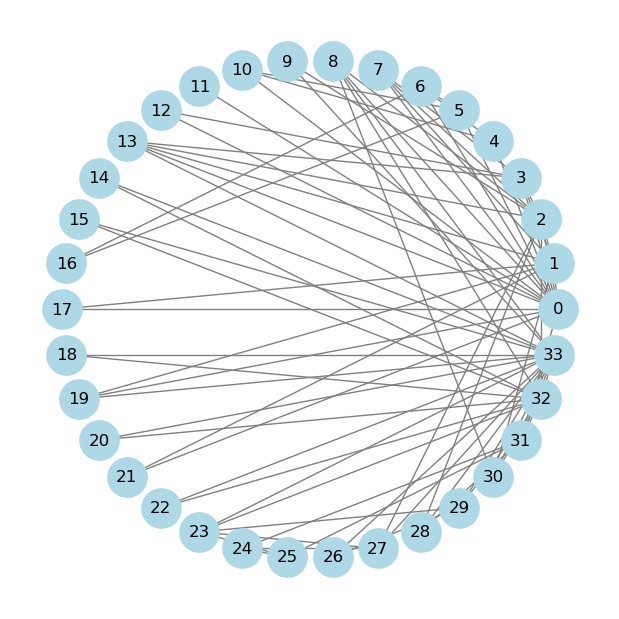

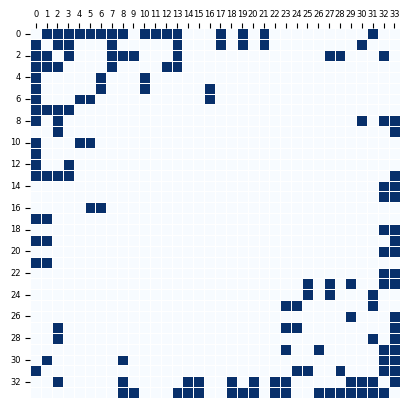

In [2]:
G = nx.karate_club_graph()
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())
print("Connected components:", nx.number_connected_components(G))
node_mapping = {node: i for i, node in enumerate(G.nodes())}
G = nx.relabel_nodes(G, node_mapping)
n = len(G.nodes)

plt.figure(figsize=(6,6))
nx.draw(G, pos=nx.circular_layout(G), with_labels=True, node_color='lightblue', edge_color='gray', node_size=800)
#plt.title("Karate Network")
plt.show()


Y = nx.to_numpy_array(G, dtype=float)
Y =  np.int32(Y > 0)
sns.heatmap(Y, annot=False, cmap="Blues", cbar=False, square=True, linewidths=0.5, linecolor='white')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.gca().xaxis.tick_top() 
plt.gca().tick_params(top=True, bottom=False, labeltop=True, labelbottom=False, labelsize=6)
#plt.title("Sociomatrix")
plt.show()

# Model $\mathbb{R}^2$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 5000 and thinning 5
Number of draws per chain: 30000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -242.6032
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 5002/30000 [14:06<1:08:56,  6.04 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.5823
Final sigma_q_alpha: 0.3561


Sampling progress: 100%|██████████| 30000/30000 [1:28:45<00:00,  5.63 draws/s]


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 5002/30000 [15:44<1:04:15,  6.48 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.5666
Final sigma_q_alpha: 0.4541


Sampling progress: 100%|██████████| 30000/30000 [1:22:52<00:00,  6.03 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0171
Minimum ESS/n: 0.0034
Maximum ESS/n: 0.0750
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -259.8490        -121.8588        -381.7078
ML                -242.6032        -148.5640        -391.1672
CM                -226.5585        -134.6803        -361.2388
MAP               -142.4158        -135.4161        -277.8320
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 1004.3407
DIC: 967.3135
BIC: 1268.2786

Final acceptance rate Z: 0.4122
Final acceptance rate alpha: 0.3932
********************************

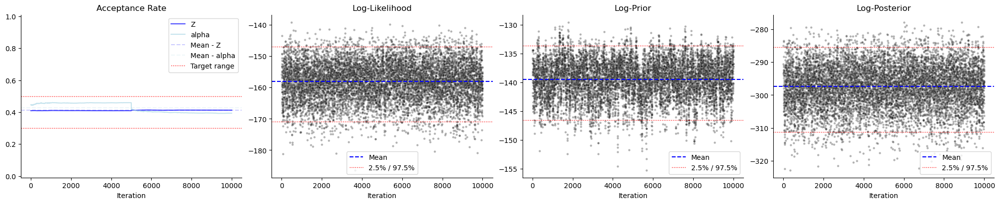

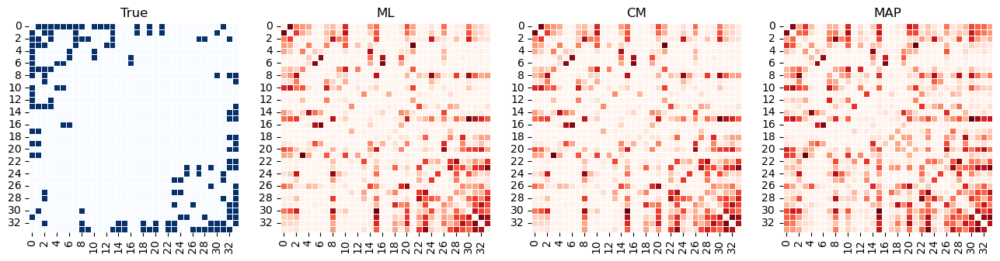

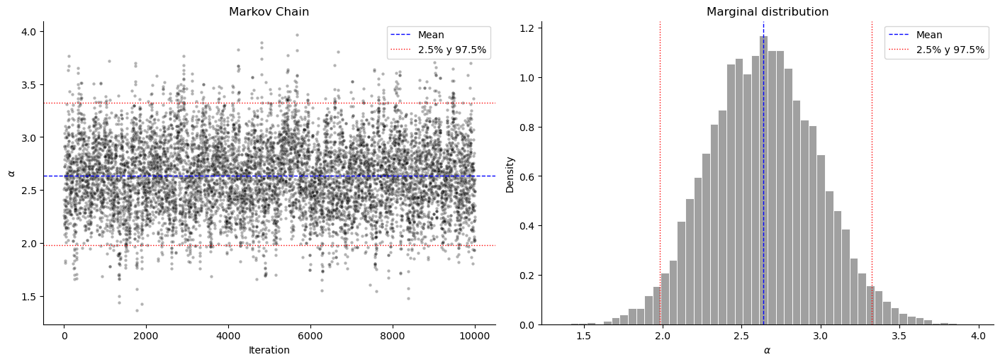

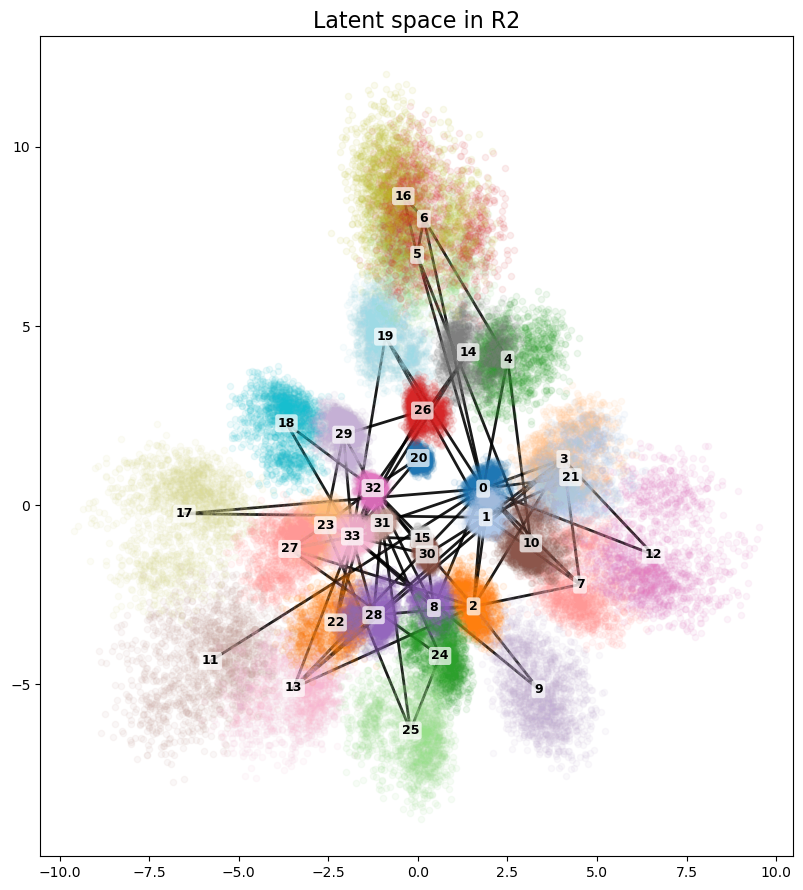

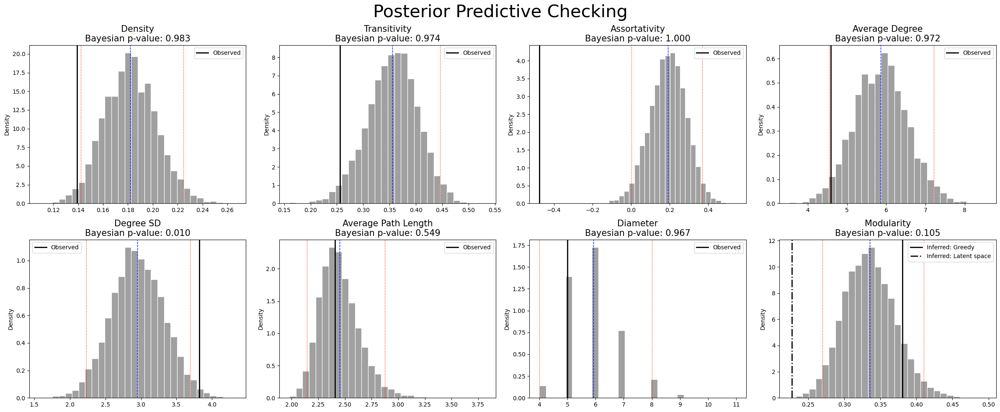

c:\Users\carlo\OneDrive\Documents\LatentSpaces_Network_Manifold\LSMN_P.py:1462: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


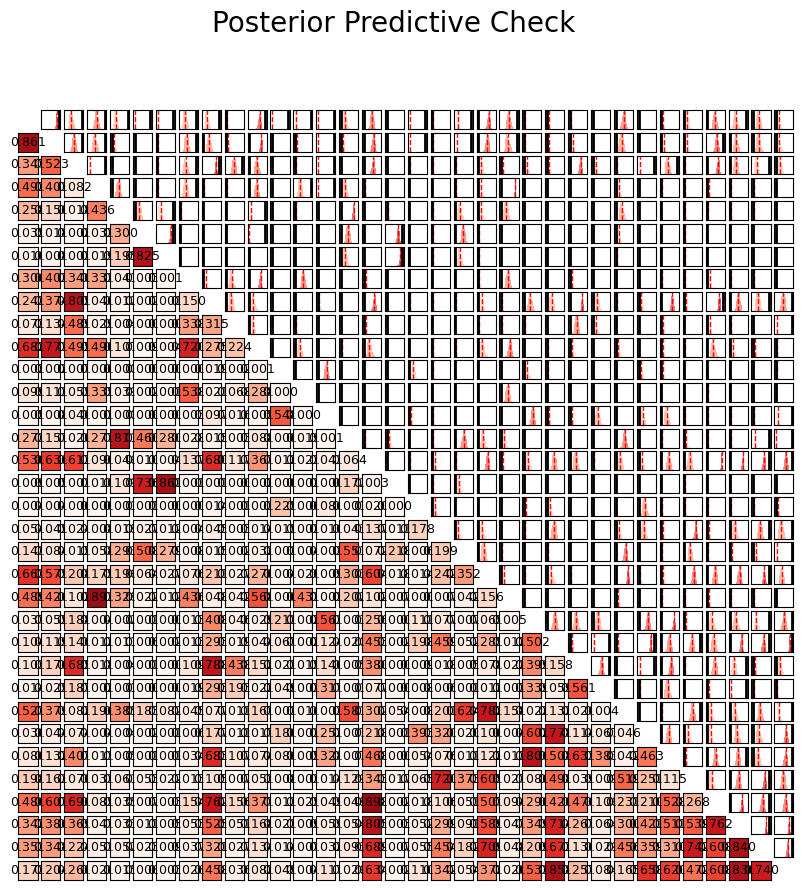

c:\Users\carlo\OneDrive\Documents\LatentSpaces_Network_Manifold\LSMN_P.py:1554: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


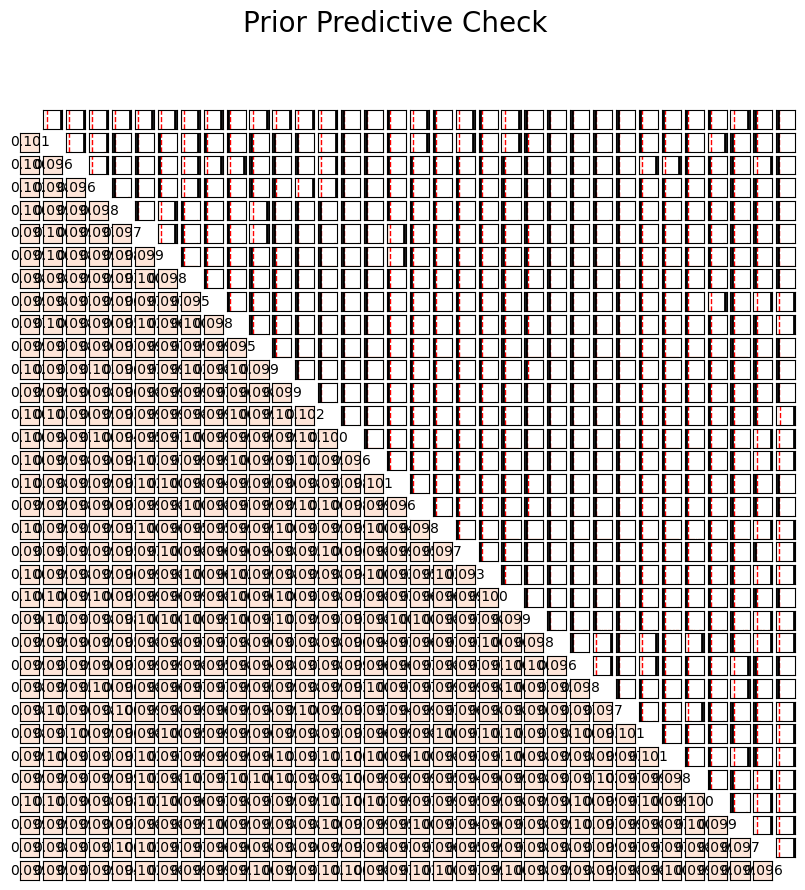

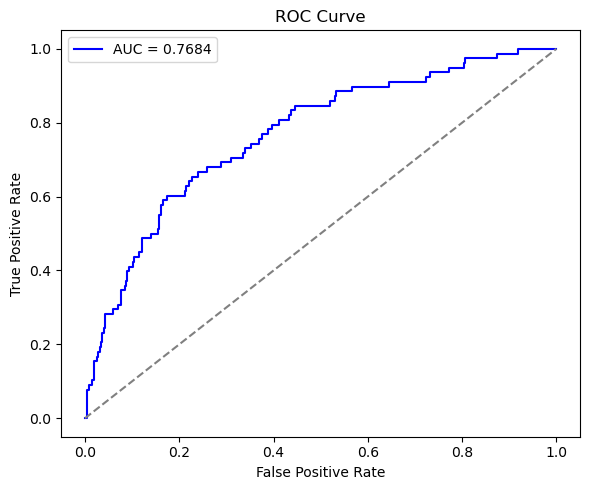

Model: Euclidean
Confussion matrix:  {'tp': 27, 'tn': 442, 'fp': 41, 'fn': 51}
AUC: 0.7684
Accuracy: 0.8360
Precision: 0.3971
Recall: 0.3462
F1-score: 0.3699
Specificity: 0.9151
Results successfully saved to: resultsR2.pkl


In [19]:
# Configuration
Theta_R2 = {
    'Z0': np.random.normal(0, 1, size=(n, 2)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 5000,       
    'thin': 5,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR2 = Estimation_LSMN(Y, Theta_R2, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR2)

#Visualizing latent space
plot_latent_space(resultsR2)

# Posterior predictive checking
posterior_predictive_check(resultsR2)

# Prior predictive checking
prior_predictive_check(resultsR2)

# Prediction evaluation
metricsR2 = prediction_evaluation(resultsR2)

# Save results
handle_results(resultsR2, filepath='resultsR2.pkl', mode='save')

# Model $\mathbb{R}^3$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 5000 and thinning 5
Number of draws per chain: 30000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -195.7324
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 5002/30000 [14:36<1:05:49,  6.33 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.4178
Final sigma_q_alpha: 0.5647


Sampling progress: 100%|██████████| 30000/30000 [1:20:43<00:00,  6.19 draws/s]


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 5002/30000 [12:30<1:02:27,  6.67 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.3829
Final sigma_q_alpha: 0.3633


Sampling progress: 100%|██████████| 30000/30000 [1:15:13<00:00,  6.65 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0845
Minimum ESS/n: 0.0049
Maximum ESS/n: 0.0545
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -233.2848        -152.6792        -385.9640
ML                -195.7324        -212.4879        -408.2203
CM                -181.6191        -181.8067        -363.4257
MAP               -124.6071        -178.8192        -303.4263
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 902.0090
DIC: 839.7833
BIC: 1266.9198

Final acceptance rate Z: 0.4372
Final acceptance rate alpha: 0.4810
********************************


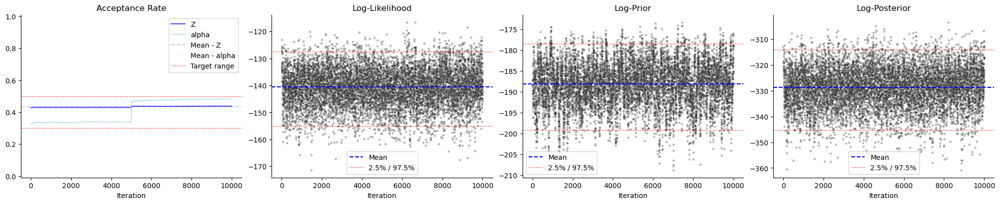

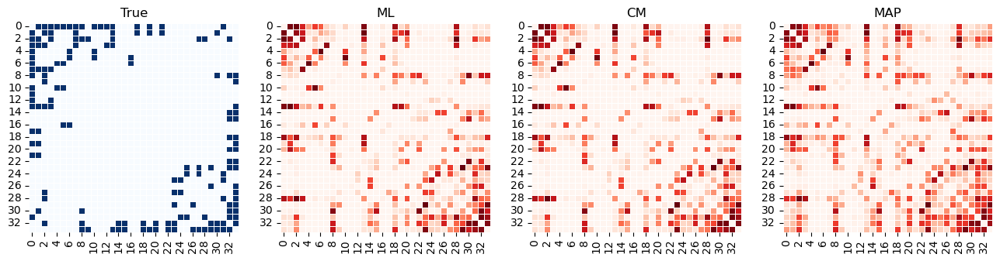

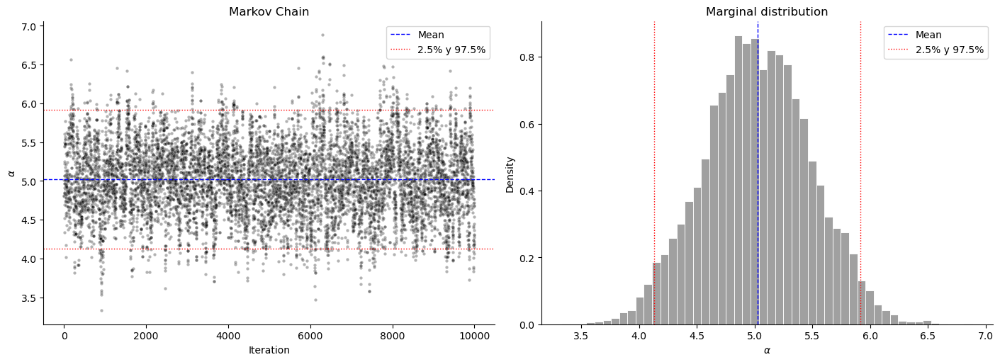

In [ ]:
# Configuration
Theta_R3 = {
    'Z0': np.random.normal(0, 1, size=(n, 3)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 5000,       
    'thin': 5,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR3 = Estimation_LSMN(Y, Theta_R3, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR3)

#Visualizing latent space
plot_latent_space(resultsR3)

# Posterior predictive checking
posterior_predictive_check(resultsR3)

# Prior predictive checking
prior_predictive_check(resultsR3)

# Prediction evaluation
metricsR3 = prediction_evaluation(resultsR3)

# Save results
handle_results(resultsR3, filepath='resultsR3.pkl', mode='save')

# Model $\mathbb{S}^1$

Metropolis-Hastings for Spherical latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 5000 and thinning 5
Number of draws per chain: 30000
Initial sigma_q_Z: 50.0000
Initial sigma_q_alpha: 0.5000
Initial sigma_q_beta: 0.5000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -183.7776
------------------------------------------------------------
Log-prior:
sigma_prior_alpha:  1.0
sigma_prior_beta:  1.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 5003/30000 [09:00<40:01, 10.41 draws/s]  

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 4.1037
Final sigma_q_alpha: 0.3556
Final sigma_q_beta: 0.5388


Sampling progress: 100%|██████████| 30000/30000 [53:38<00:00,  9.32 draws/s]  


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 5003/30000 [08:30<41:07, 10.13 draws/s]  

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 4.1037
Final sigma_q_alpha: 0.3757
Final sigma_q_beta: 0.4975


Sampling progress: 100%|██████████| 30000/30000 [1:18:24<00:00,  6.38 draws/s]     


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0024
Minimum ESS/n: 0.0492
Maximum ESS/n: 0.6991
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -962.7783         -80.8485       -1043.6268
ML                -183.7776        -124.2678        -308.0455
CM                -167.1513        -115.9826        -283.1339
MAP               -168.3705        -112.5439        -280.9144
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 836.8715
DIC: 818.1988
BIC: 979.8783

Final acceptance rate Z: 0.6164
Final acceptance rate alpha: 0.3953
Final acceptance rate beta: 0.3761

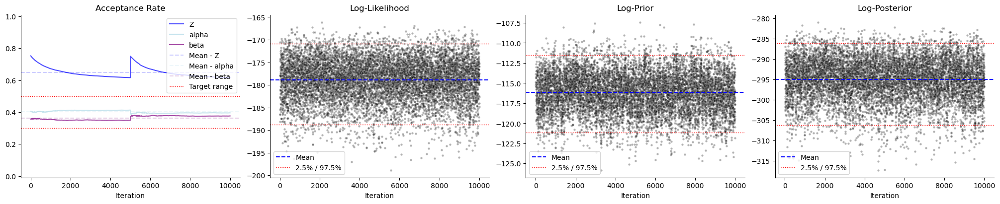

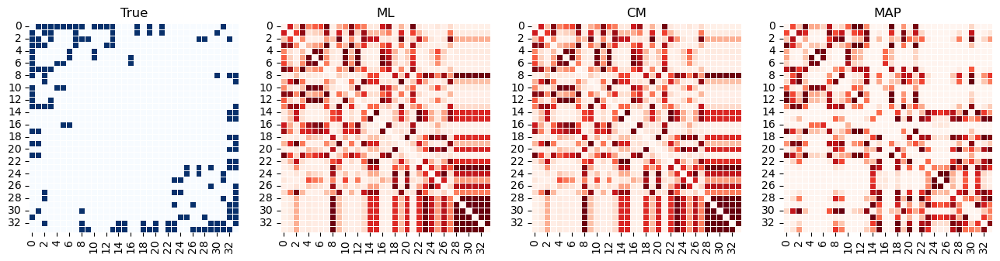

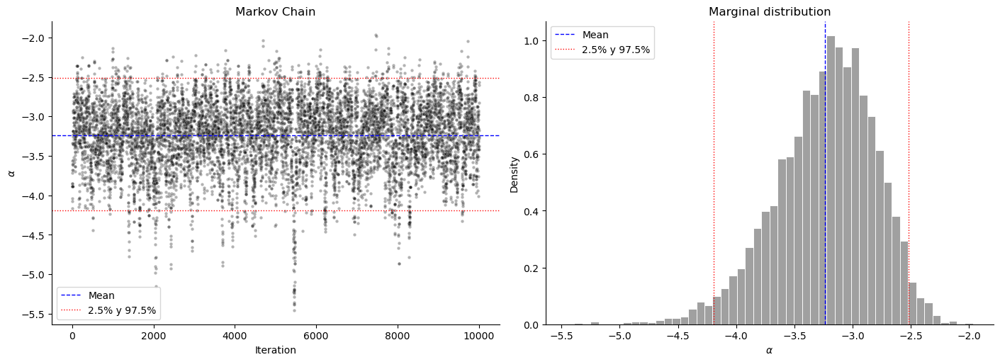

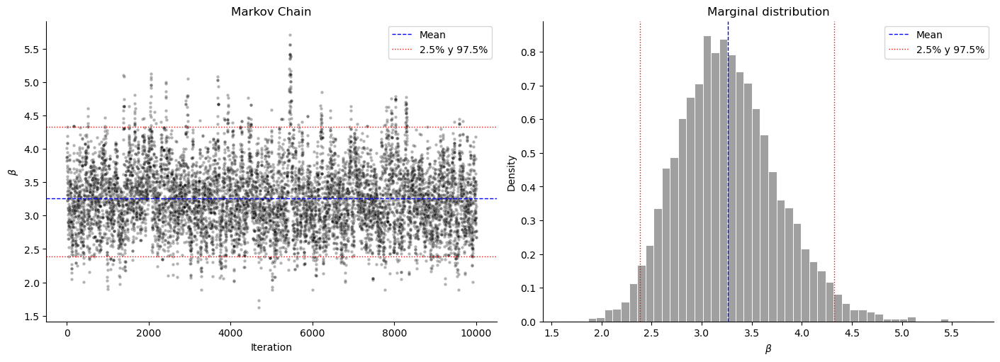

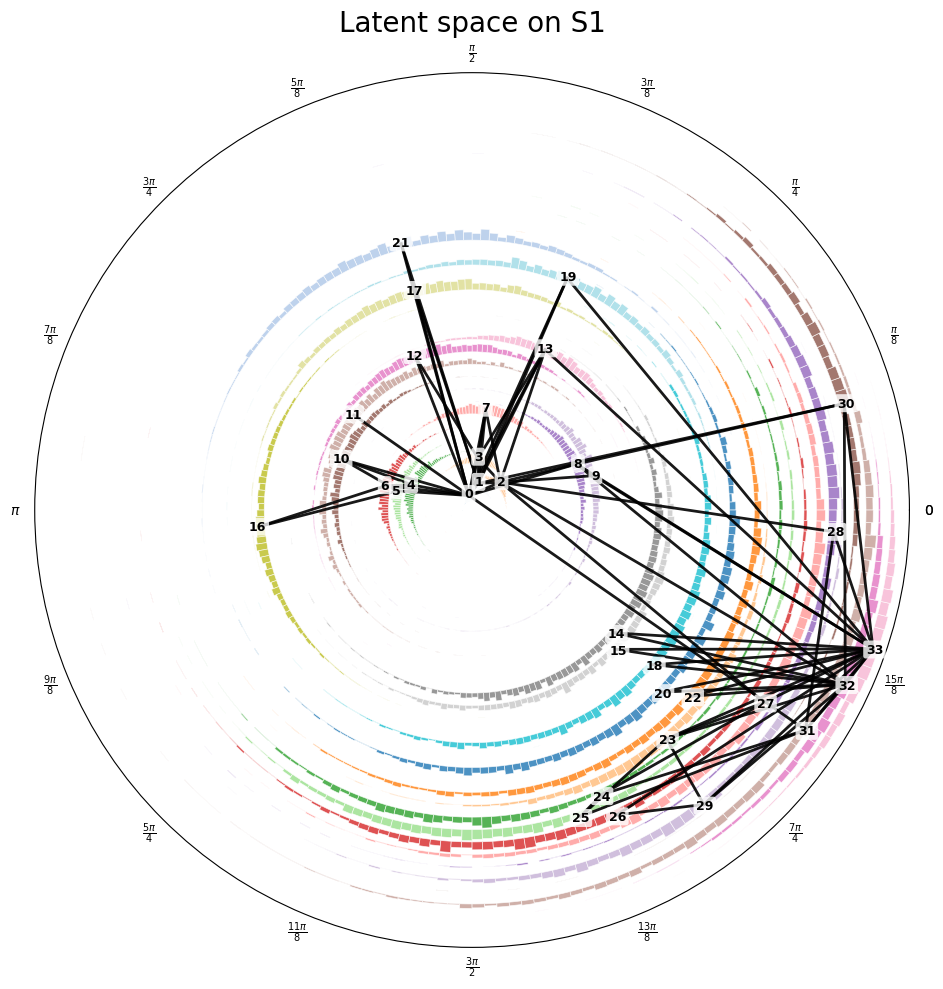

c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\carlo\anaconda3\Lib\site-p

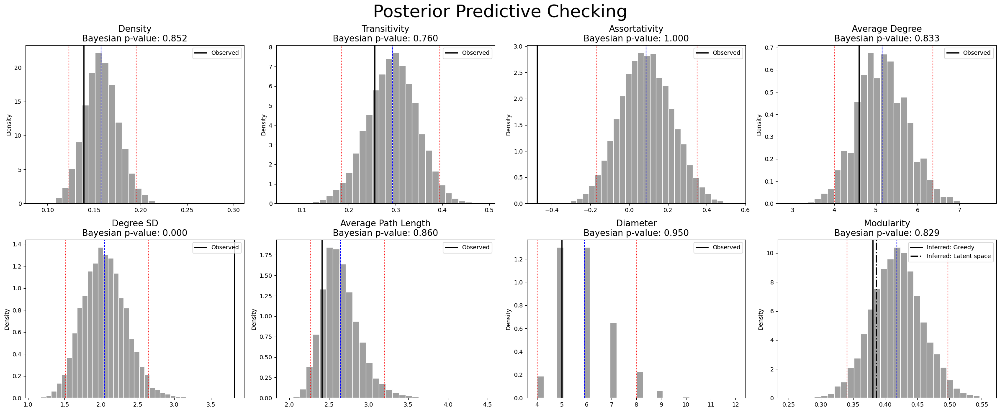

c:\Users\carlo\OneDrive\Documents\LatentSpaces_Network_Manifold\LSMN_P.py:1462: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


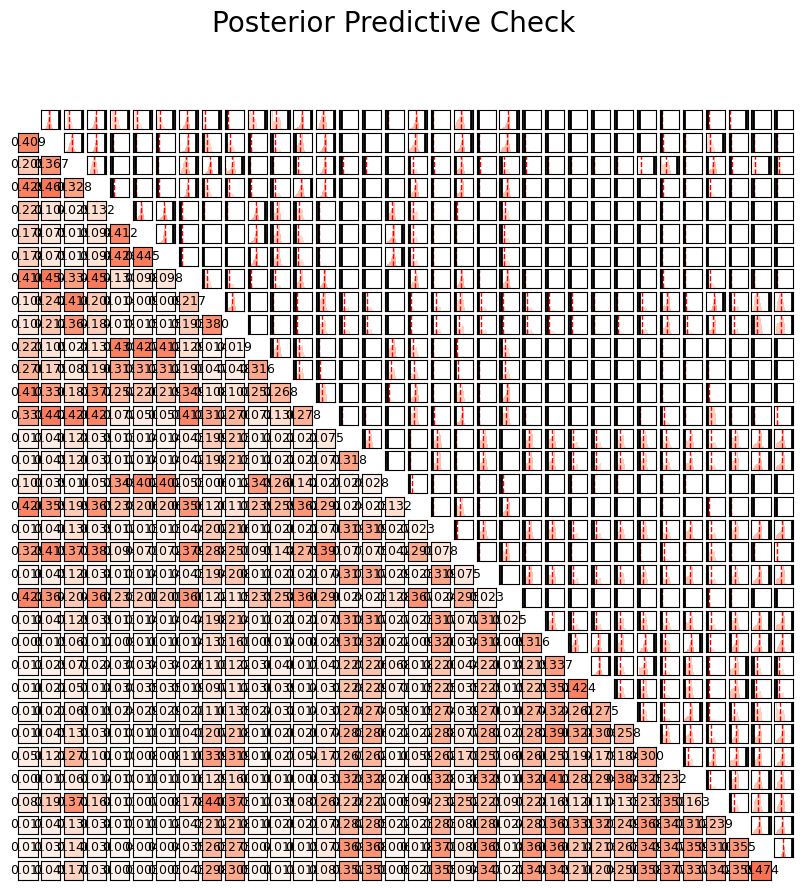

c:\Users\carlo\OneDrive\Documents\LatentSpaces_Network_Manifold\LSMN_P.py:1554: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


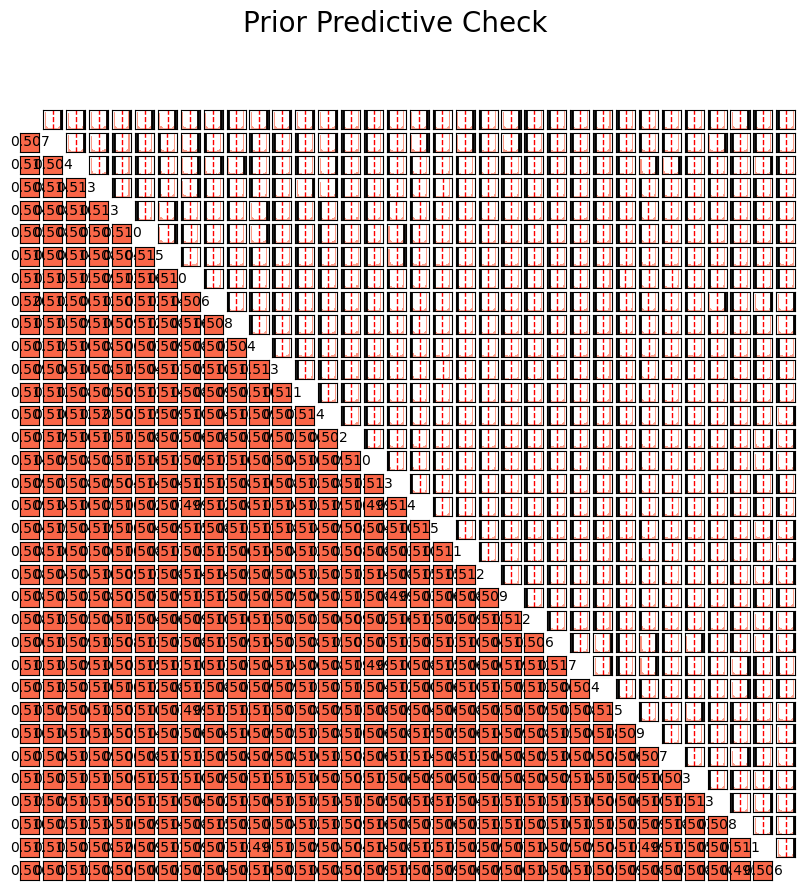

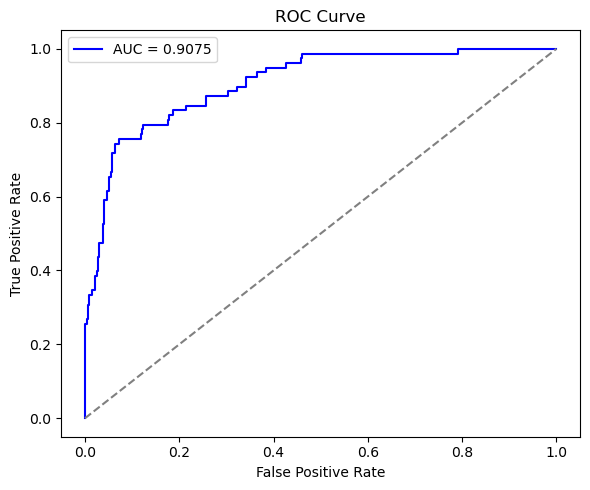

Model: Spherical
Confussion matrix:  {'tp': 0, 'tn': 483, 'fp': 0, 'fn': 78}
AUC: 0.9075
Accuracy: 0.8610
Precision: 0.0000
Recall: 0.0000
F1-score: 0.0000
Specificity: 1.0000
Results successfully saved to: resultsS1.pkl


In [4]:
# Configuration
Theta_S1 = {
    'Z0': random_VMF(np.array([0,1]), 0, n),
    'alpha0': np.float64(0.0),
    'beta0': np.float64(5.0),
    'rho': -0.5,
    'mu_alpha_beta': np.array([0.0, 10.0]),
    'sigma_prior_alpha': 1.0,
    'sigma_prior_beta': 1.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 5000,       
    'thin': 5,                
    'sigma_q_Z': 50.0,       
    'sigma_q_alpha': 0.5,    
    'sigma_q_beta': 0.5      
}

# Estimation
resultsS1 = Estimation_LSMN(Y, Theta_S1, Model="Spherical")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsS1)

#Visualizing latent space
plot_latent_space(resultsS1)

# Posterior predictive checking
posterior_predictive_check(resultsS1)

# Prior predictive checking
prior_predictive_check(resultsS1)

# Prediction evaluation
metricsS1 = prediction_evaluation(resultsS1)

# Save results
handle_results(resultsS1, filepath='resultsS1.pkl', mode='save')

# Model $\mathbb{S}^2$

Metropolis-Hastings for Spherical latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 5000 and thinning 5
Number of draws per chain: 30000
Initial sigma_q_Z: 50.0000
Initial sigma_q_alpha: 0.2000
Initial sigma_q_beta: 0.2000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -170.7162
------------------------------------------------------------
Log-prior:
sigma_prior_alpha:  1.0
sigma_prior_beta:  1.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 5003/30000 [08:44<41:24, 10.06 draws/s]  

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 4.1037
Final sigma_q_alpha: 0.3055
Final sigma_q_beta: 0.7727


Sampling progress: 100%|██████████| 30000/30000 [49:45<00:00, 10.05 draws/s] 


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 5004/30000 [08:01<39:23, 10.58 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 4.1037
Final sigma_q_alpha: 0.5615
Final sigma_q_beta: 0.5171


Sampling progress: 100%|██████████| 30000/30000 [48:28<00:00, 10.31 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0022
Minimum ESS/n: 0.0508
Maximum ESS/n: 0.5911
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -838.8250        -104.4155        -943.2405
ML                -170.7162        -140.6214        -311.3375
CM                -165.5814        -129.4112        -294.9925
MAP               -150.3528        -124.3047        -274.6575
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 846.0449
DIC: 775.8620
BIC: 1110.4855

Final acceptance rate Z: 0.4147
Final acceptance rate alpha: 0.3050
Final acceptance rate beta: 0.419

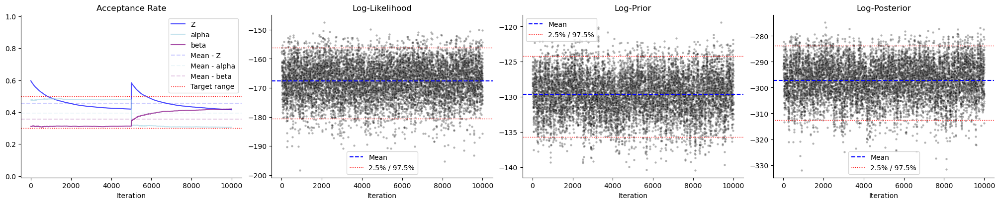

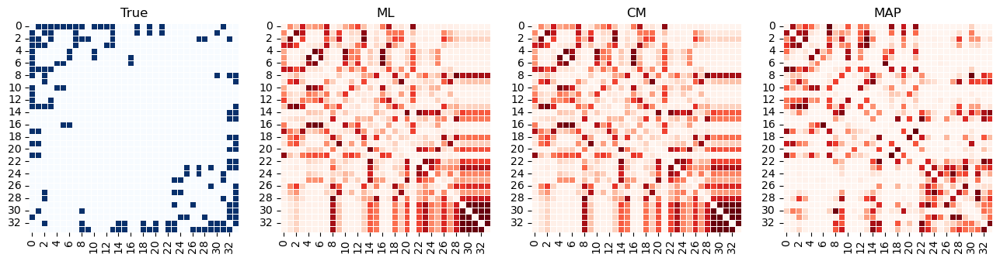

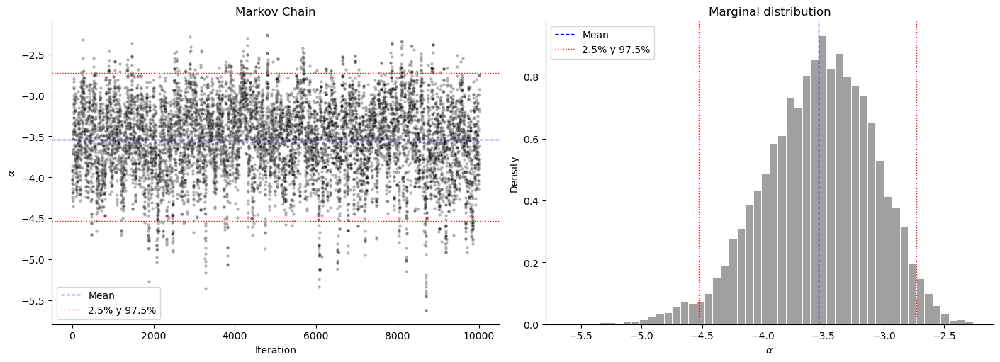

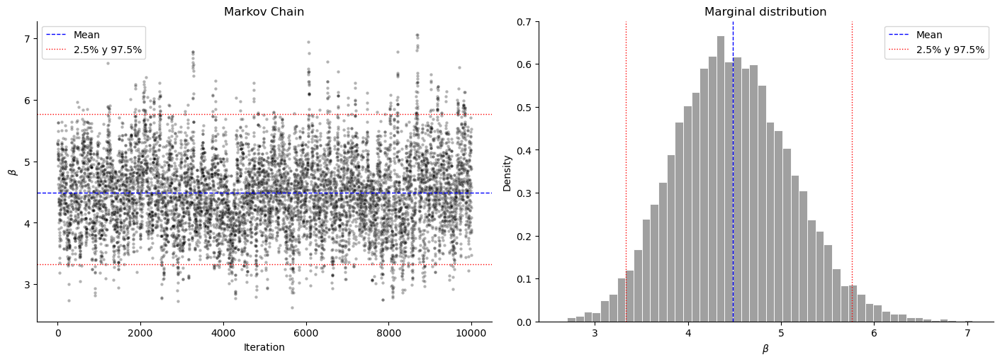

c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

c:\Users\carlo\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning:

Graph is

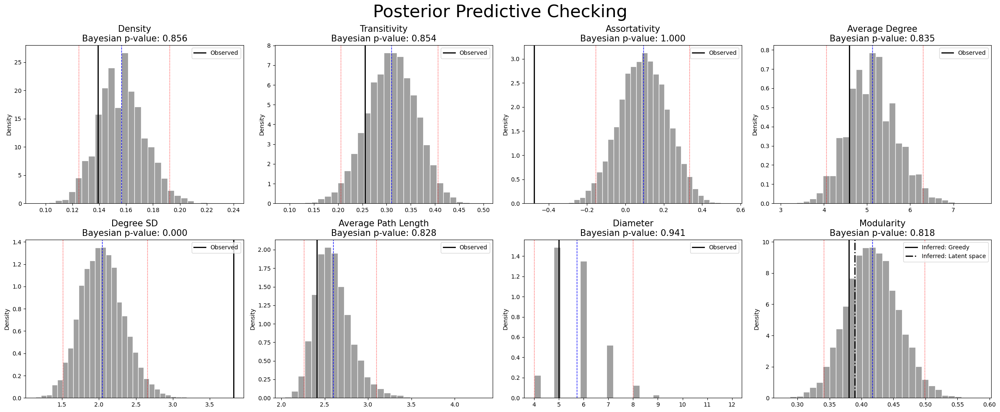

c:\Users\carlo\OneDrive\Documents\LatentSpaces_Network_Manifold\LSMN_P.py:1462: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



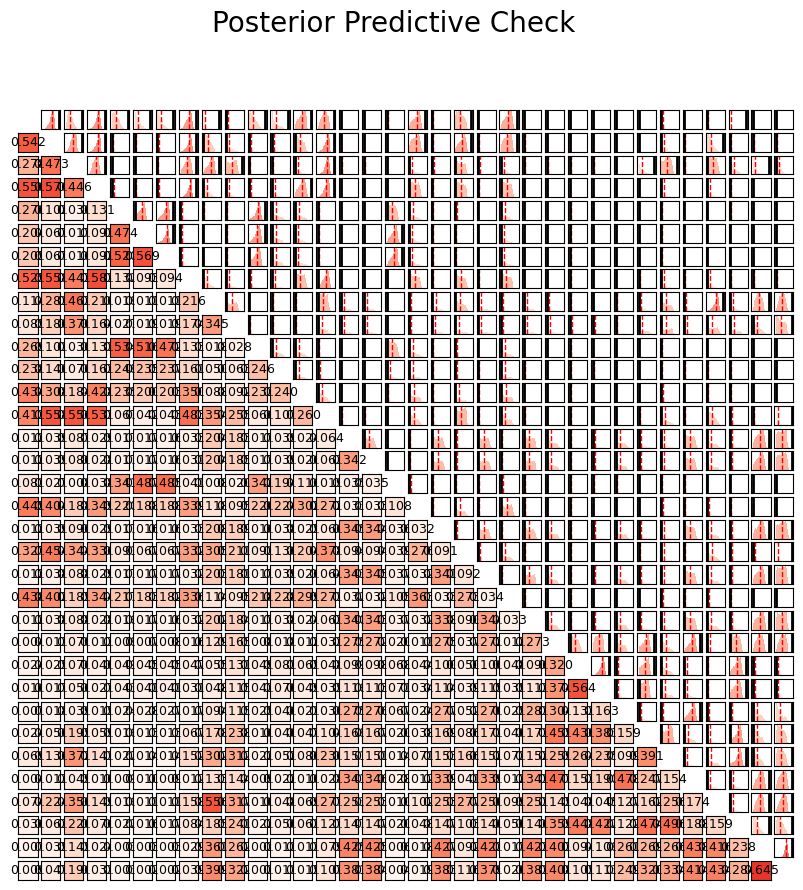

c:\Users\carlo\OneDrive\Documents\LatentSpaces_Network_Manifold\LSMN_P.py:1554: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



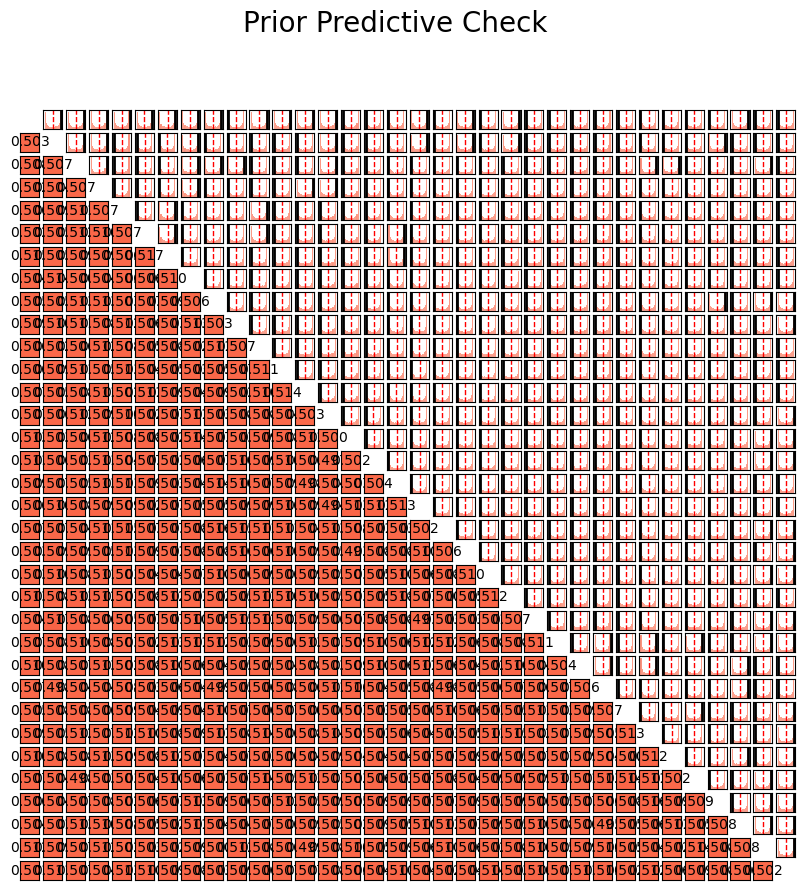

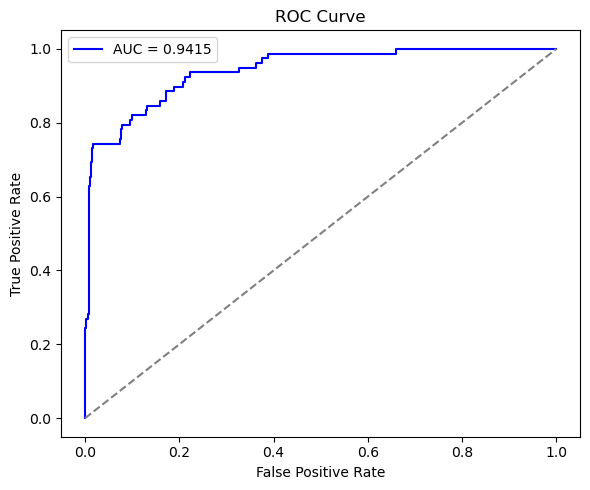

Model: Spherical
Confussion matrix:  {'tp': 16, 'tn': 483, 'fp': 0, 'fn': 62}
AUC: 0.9415
Accuracy: 0.8895
Precision: 1.0000
Recall: 0.2051
F1-score: 0.3404
Specificity: 1.0000


In [5]:
# Configuration
Theta_S2 = {
    'Z0': random_VMF(np.array([0,0,1]), 0, size=n),
    'alpha0': np.float64(0.0),
    'beta0': np.float64(5.0),
    'rho': -0.5,
    'mu_alpha_beta': np.array([0.0, 10.0]),
    'sigma_prior_alpha': 1.0,
    'sigma_prior_beta': 1.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 5000,       
    'thin': 5,            
    'sigma_q_Z': 50.0,       
    'sigma_q_alpha': 0.2,    
    'sigma_q_beta': 0.2      
}


# Estimation
resultsS2 = Estimation_LSMN(Y, Theta_S2, Model="Spherical")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsS2)

#Visualizing latent space
plot_latent_space(resultsS2)

# Posterior predictive checking
posterior_predictive_check(resultsS2)

# Prior predictive checking
prior_predictive_check(resultsS2)

# Prediction evaluation
metricsS2 = prediction_evaluation(resultsS2)

# Save results
#handle_results(resultsS2, filepath='resultsS2.pkl', mode='save')

# Model comparisson

In [3]:
resultsR2 = handle_results( filepath='resultsR2.pkl', mode='load')
resultsR3 = handle_results( filepath='resultsR3.pkl', mode='load')
resultsS1 = handle_results( filepath='resultsS1.pkl', mode='load')
resultsS2 = handle_results( filepath='resultsS2.pkl', mode='load')

Results successfully loaded from: resultsR2.pkl
Results successfully loaded from: resultsR3.pkl
Results successfully loaded from: resultsS1.pkl
Results successfully loaded from: resultsS2.pkl


In [10]:
df_comparison = model_comparison({
    'Euclidean_R2': resultsR2,
    'Euclidean_R3': resultsR3,
    'Spherical_S1': resultsS1,
    'Spherical_S2': resultsS2
})
df_comparison

KeyError: 'point_estimators_log_likelihood'